In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

from datetime import timedelta, datetime
#import holidays

import matplotlib
import pickle
import seaborn as sns

import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objs as go

matplotlib.pyplot.style.use('ggplot')
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.6f' % x)
pd.set_option('display.width', 500)

In [2]:
df_poor = pd.read_csv('../data/train_economic_class/df_poor.csv')

In [3]:
df_poor.shape

(24602, 29)

In [4]:
df_poor['target_class'] = np.where(df_poor['TARGET'] == 0.0, 1, 0) # class 1 means TARGET is 0.0 

In [5]:
df_poor_reg = df_poor[df_poor['target_class'] == 0]

In [6]:
df_poor_reg.shape

(12953, 30)

In [7]:
df_poor_reg.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12953 entries, 1 to 24601
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      12953 non-null  int64  
 1   TARGET                  12953 non-null  float64
 2   open_year               12953 non-null  int64  
 3   open_month              12953 non-null  int64  
 4   first_prediction        12953 non-null  float64
 5   log_first_prediction    12953 non-null  float64
 6   economic_class          12953 non-null  object 
 7   log_TARGET              12953 non-null  float64
 8   Retention_count_D0_3    12953 non-null  int64  
 9   Retention_count_D4_7    12953 non-null  int64  
 10  Retention_count_D8_11   12953 non-null  int64  
 11  Retention_count_D12_15  12953 non-null  int64  
 12  Avg_Lvl_Count_D0_3      12953 non-null  float64
 13  Avg_Lvl_Count_D4_7      12953 non-null  float64
 14  Avg_Lvl_Count_D8_11     12953 non-null  flo

In [8]:
df_poor_reg.describe()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue,target_class
count,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000,12953.000000
mean,438733.333822,0.053394,2024.000000,3.230835,0.635301,-0.559460,-7.392414,2.753957,1.686096,1.319694,1.143828,10.629873,5.608430,4.102602,3.440902,102.819373,179.978634,154.185697,0.020127,0.011279,0.007796,0.006346,0.000200,0.000000,0.000000,0.000000,0.045549,0.000200,0.000000
std,253826.129791,0.314947,0.000000,1.507645,0.211807,0.603446,4.628823,1.074325,1.429355,1.398158,1.359689,13.642751,10.773947,9.443415,8.652872,140.895073,155.428706,161.321638,0.055766,0.057165,0.028001,0.026399,0.018006,0.000000,0.000000,0.000000,0.127106,0.018006,0.000000
min,15.000000,-0.000000,2024.000000,1.000000,0.000100,-9.114879,-13.815511,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,217749.000000,0.000000,2024.000000,2.000000,0.508093,-0.677071,-13.815511,2.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,48.666667,101.750000,86.000000,0.000684,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003886,0.000000,0.000000
50%,436040.000000,0.003222,2024.000000,3.000000,0.654000,-0.424633,-5.737576,3.000000,1.000000,1.000000,1.000000,5.750000,1.250000,0.250000,0.000000,76.666667,149.250000,128.000000,0.006361,0.001060,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.014748,0.000000,0.000000
75%,659581.000000,0.023620,2024.000000,5.000000,0.801751,-0.220945,-3.745640,4.000000,3.000000,2.000000,2.000000,13.000000,6.250000,3.750000,2.750000,121.333333,220.000000,191.333333,0.020799,0.009195,0.004894,0.003080,0.000000,0.000000,0.000000,0.000000,0.044631,0.000000,0.000000
max,878565.000000,21.396171,2024.000000,5.000000,0.951095,-0.050131,3.063212,4.000000,4.000000,4.000000,4.000000,175.500000,152.000000,147.500000,179.500000,8340.666667,5738.000000,7895.000000,2.096290,5.316189,0.968628,1.158346,1.943500,0.000000,0.000000,0.000000,7.447027,1.943500,0.000000


In [9]:
X_cols = [col for col in df_poor_reg.columns if col not in ['ID', 'open_year', 'open_month', 'economic_class', 'target_class',
                                                           'first_prediction', 'TARGET']]

In [10]:
df_poor_reg.log_TARGET.describe()

count   12953.000000
mean       -7.392414
std         4.628823
min       -13.815511
25%       -13.815511
50%        -5.737576
75%        -3.745640
max         3.063212
Name: log_TARGET, dtype: float64

<Axes: >

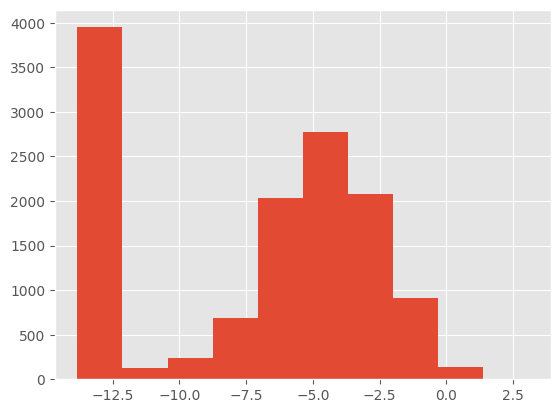

In [11]:
df_poor_reg.log_TARGET.hist()

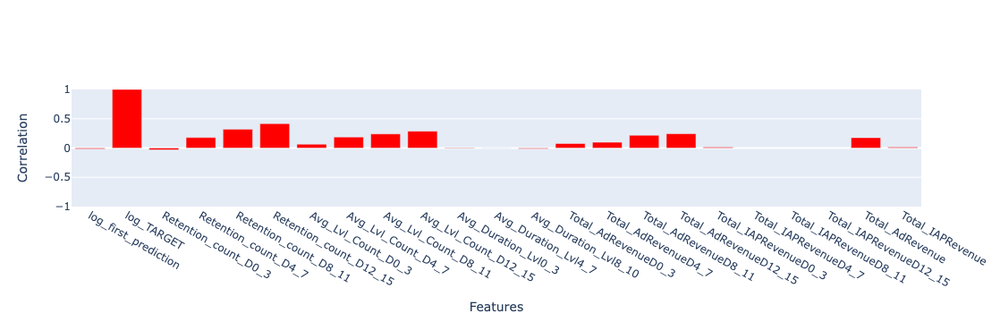

In [14]:
target_corr = df_poor_reg[X_cols].corr()['log_TARGET']

fig = go.Figure([go.Bar(y = target_corr, x = target_corr.index, marker_color = 'red')])

fig.update_layout(xaxis_title = "Features", yaxis_title = "Correlation",
    yaxis = dict(
        range=(-1, 1),
        showticklabels=True
    ))
fig.show()

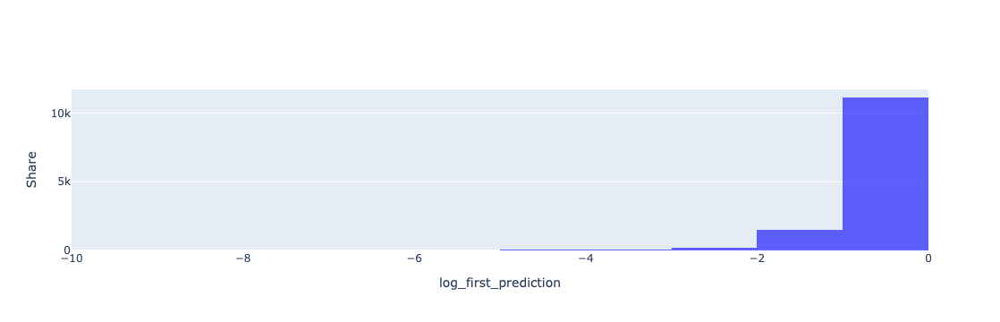

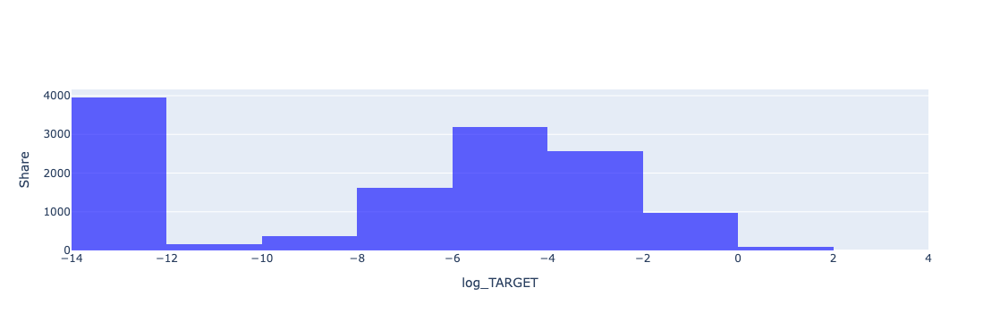

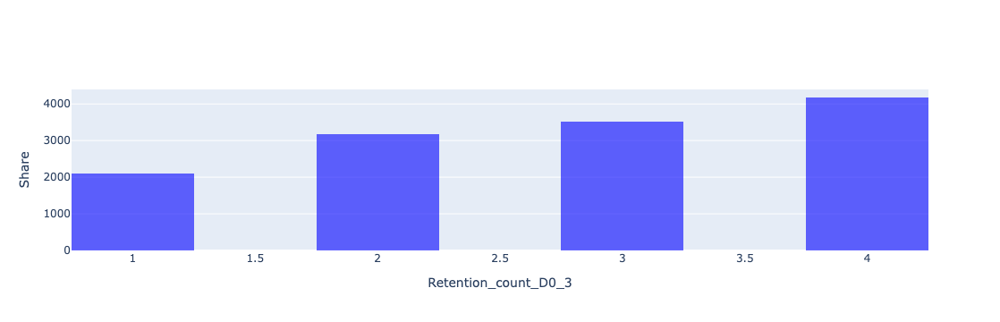

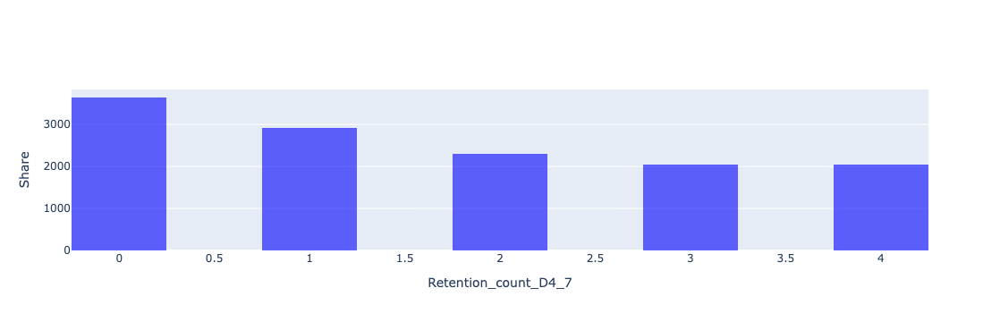

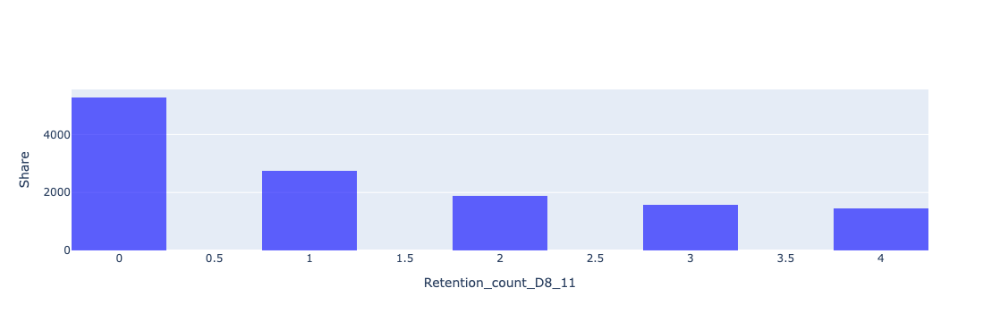

...

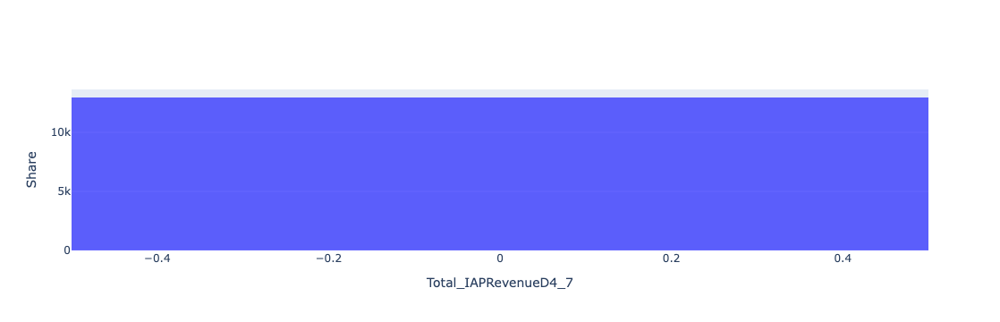

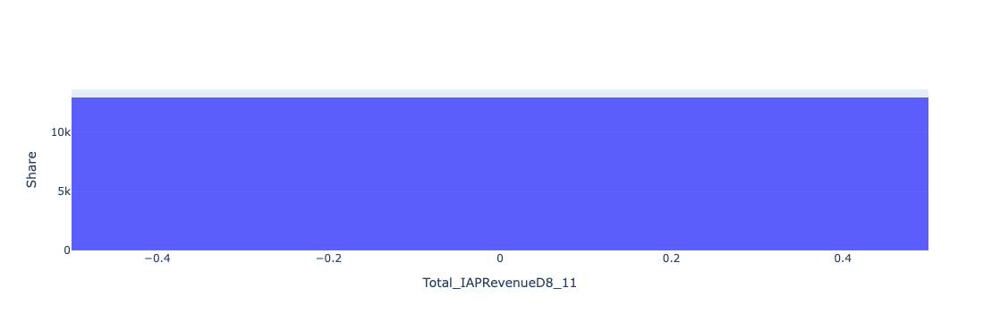

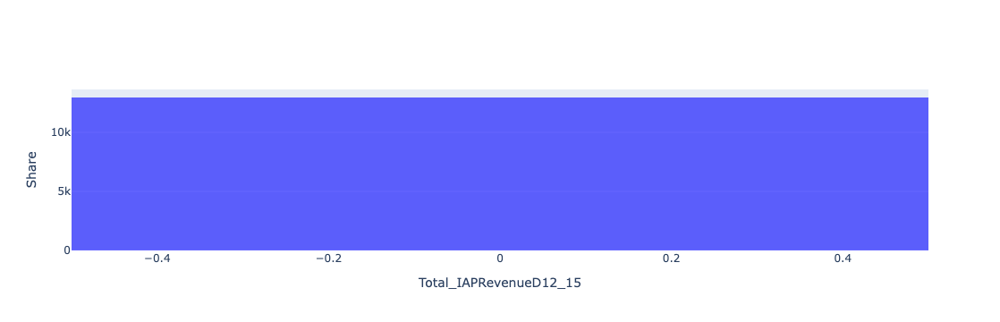

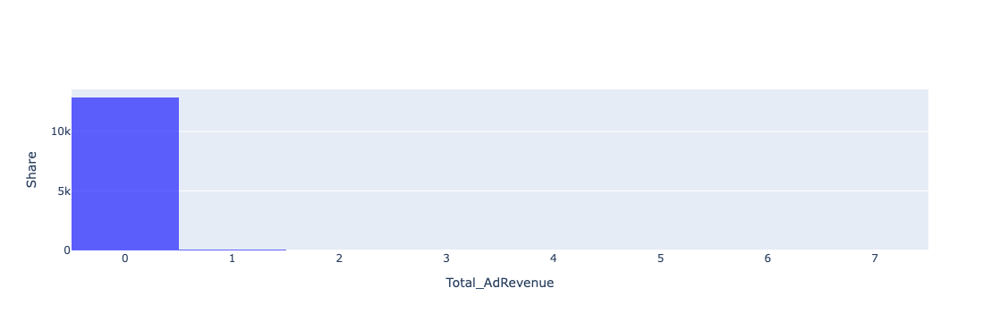

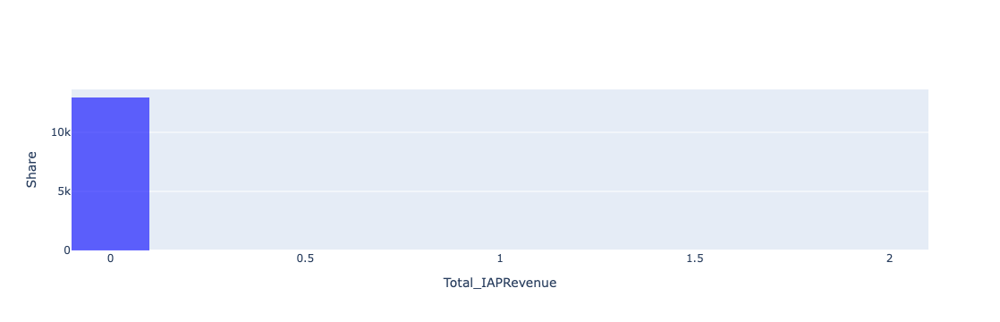

In [15]:
for feature in X_cols:

    fig = go.Figure()
    fig.add_trace(go.Histogram(x = df_poor_reg[feature],
                 marker_color = 'blue', opacity = 0.6, nbinsx = 10))


    fig.update_layout(
        legend = dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
        ),
        xaxis_title = feature,
        yaxis_title = "Share"
    )
    fig.show()

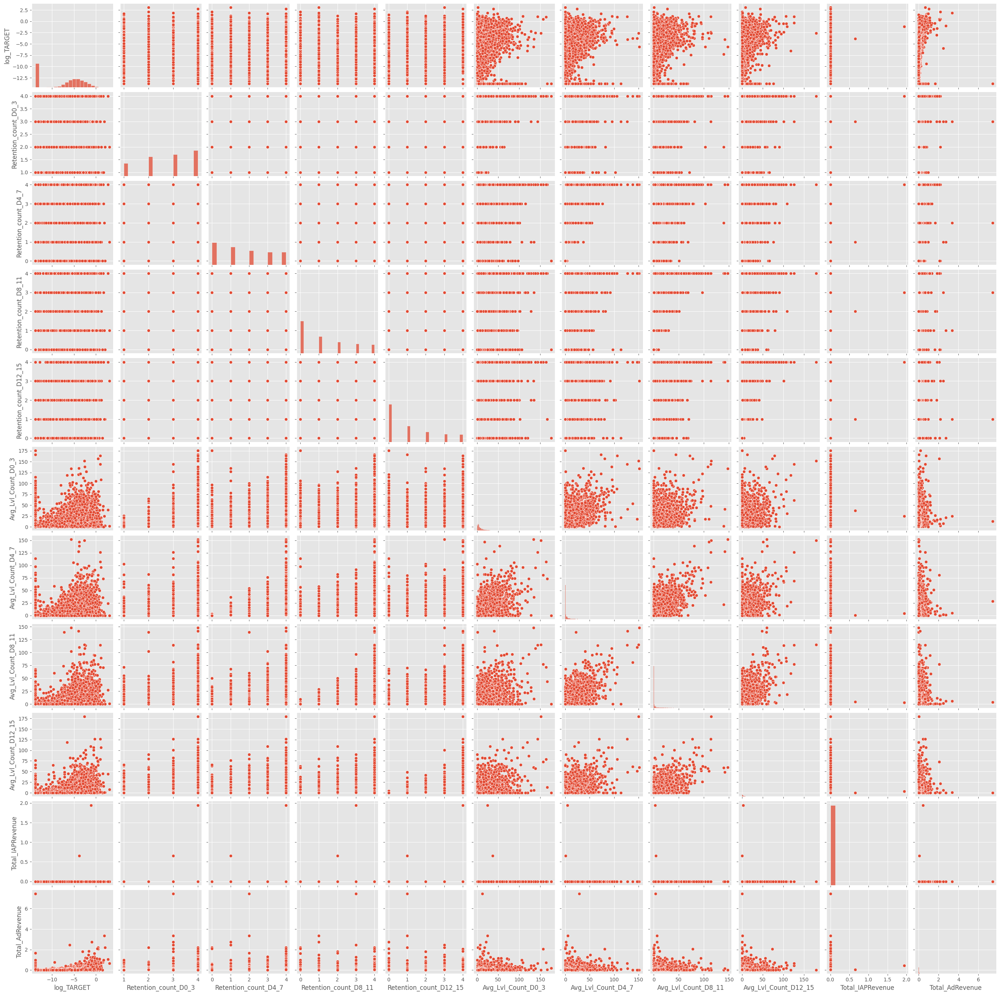

In [16]:
sns.pairplot(df_poor_reg.loc[:,['log_TARGET', 'Retention_count_D0_3', 'Retention_count_D4_7', 'Retention_count_D8_11', 'Retention_count_D12_15',
                      'Avg_Lvl_Count_D0_3', 'Avg_Lvl_Count_D4_7', 'Avg_Lvl_Count_D8_11', 'Avg_Lvl_Count_D12_15',
                       'Total_IAPRevenue', 'Total_AdRevenue']])

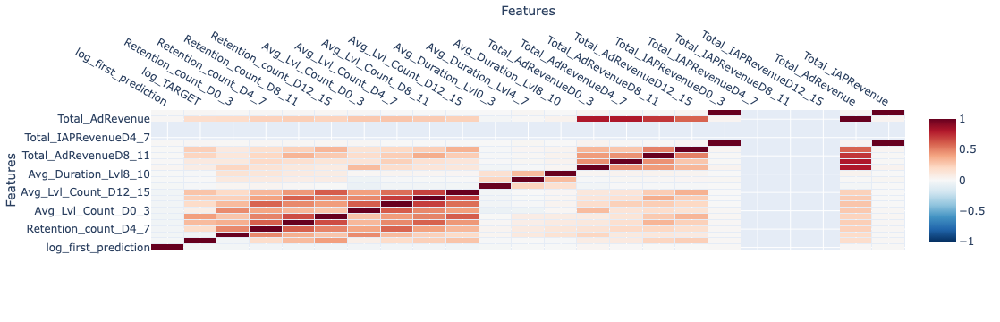

In [17]:
correlation_matrix = df_poor_reg[X_cols].corr()

fig = go.Figure(data=go.Heatmap(
                   z = correlation_matrix,
                   x = correlation_matrix.columns,
                   y = correlation_matrix.index,
                   hoverongaps = False,
                   xgap = 1,
                   ygap = 1,
                   zmin = -1,
                   zmax = 1,
    colorscale = 'rdbu_r'
))

fig.update_xaxes(side="top")
fig.update_layout(xaxis_title = "Features", yaxis_title = "Features")
fig.show()

**Model**

In [33]:
X_cols = ['Retention_count_D0_3', 'Retention_count_D4_7', 'Retention_count_D8_11', 'Retention_count_D12_15',
                      'Avg_Lvl_Count_D0_3', 'Avg_Lvl_Count_D4_7', 'Avg_Lvl_Count_D8_11', 'Avg_Lvl_Count_D12_15',
                       'Total_IAPRevenue', 'Total_AdRevenue']

In [34]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [35]:
model = RandomForestRegressor(n_estimators=100, random_state=42)

In [36]:
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(df_poor_reg[X_cols]), columns=df_poor_reg[X_cols].columns)

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, df_poor_reg.log_TARGET, test_size=0.2, random_state=42)

In [38]:
model.fit(X_train, y_train)

train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

rmse_test = np.sqrt(mean_squared_error(y_test, test_predictions))
rmse_train = np.sqrt(mean_squared_error(y_train, train_predictions))

In [39]:
print(rmse_test)
print(rmse_train)

3.971947358200483
1.539805443930659


In [40]:
importances = model.feature_importances_

feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

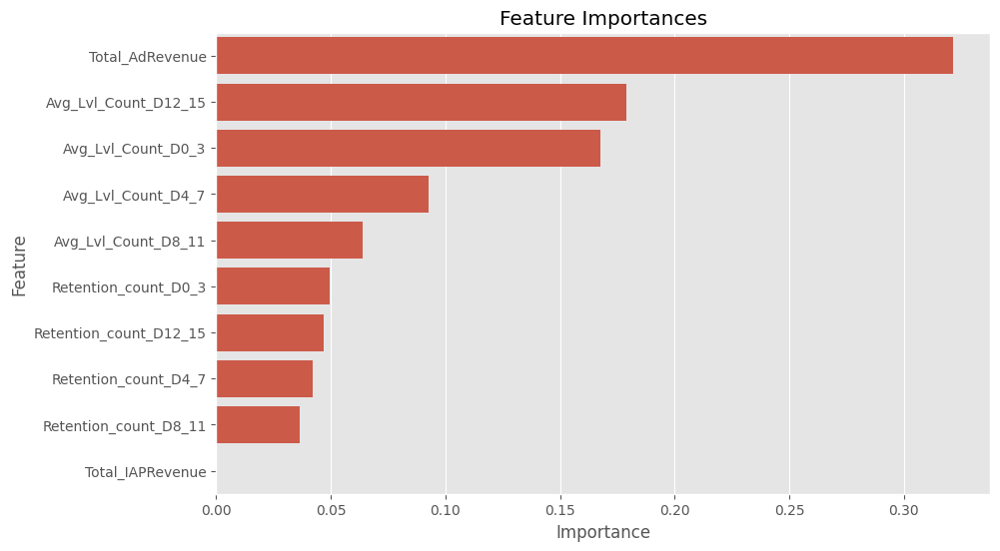

In [41]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.show()

In [42]:
with open('../models/poor_regressor.pkl', 'wb') as file:
    pickle.dump(model, file)